<a href="https://colab.research.google.com/github/nihal-rao/Integrated-Real-time-2D-hand-pose/blob/master/Training_LSMV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install detectron2

In [ ]:
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
torch.__version__
!gcc --version

In [ ]:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/torch1.4/detectron2-0.1.1%2Bcu100-cp36-cp36m-linux_x86_64.whl

In [ ]:
import shutil
shutil.copyfile("/content/drive/My Drive/KP_RN_Configs/fpn_keypoint.py","/usr/local/lib/python3.6/dist-packages/detectron2/modeling/backbone/fpn_keypoint.py" )
shutil.copyfile("/content/drive/My Drive/KP_RN_Configs/retinanet_keypoint_only.py","/usr/local/lib/python3.6/dist-packages/detectron2/modeling/meta_arch/retinanet_keypoint.py")
shutil.copyfile("/content/drive/My Drive/KP_RN_Configs/roi_head_mod_final.py","/usr/local/lib/python3.6/dist-packages/detectron2/modeling/roi_heads/roi_head_mod.py")
shutil.copyfile("/content/drive/My Drive/KP_RN_Configs/roi_head_init.py","/usr/local/lib/python3.6/dist-packages/detectron2/modeling/roi_heads/__init__.py")
shutil.copyfile("/content/drive/My Drive/KP_RN_Configs/backbone_init.py","/usr/local/lib/python3.6/dist-packages/detectron2/modeling/backbone/__init__.py")
shutil.copyfile("/content/drive/My Drive/KP_RN_Configs/meta_arch_init.py","/usr/local/lib/python3.6/dist-packages/detectron2/modeling/meta_arch/__init__.py")
shutil.copyfile("/content/drive/My Drive/KP_RN_Configs/train_loop.py","/usr/local/lib/python3.6/dist-packages/detectron2/engine/train_loop.py")
shutil.copyfile("/content/drive/My Drive/KP_RN_Configs/det_checkpoint.py","/usr/local/lib/python3.6/dist-packages/detectron2/checkpoint/detection_checkpoint.py")
shutil.copyfile("/content/drive/My Drive/KP_RN_Configs/build.py","/usr/local/lib/python3.6/dist-packages/detectron2/modeling/meta_arch/build.py")
shutil.copyfile("/content/drive/My Drive/KP_RN_Configs/keypoint_head_xy.py","/usr/local/lib/python3.6/dist-packages/detectron2/modeling/roi_heads/keypoint_head.py")

In [ ]:
import numpy as np
import os
import cv2
import random
from google.colab.patches import cv2_imshow
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog


##Loading data

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive/


In [ ]:
from detectron2.data.datasets import register_coco_instances
import os
import numpy as np
import json
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog

register_coco_instances("LSMV_train", {}, "/content/drive/My Drive/LSMV_train_correct_21.json", "/content/drive/My Drive/LSMV_imgs")
register_coco_instances("LSMV_test", {}, "/content/drive/My Drive/LSMV_test_correct_21.json", "/content/drive/My Drive/LSMV_imgs")

train_metadata = MetadataCatalog.get("LSMV_train")
val_metadata = MetadataCatalog.get("LSMV_test")

[07/25 08:09:10 d2.data.datasets.coco]: Loaded 16552 images in COCO format from /content/drive/My Drive/LSMV_test_correct_21.json


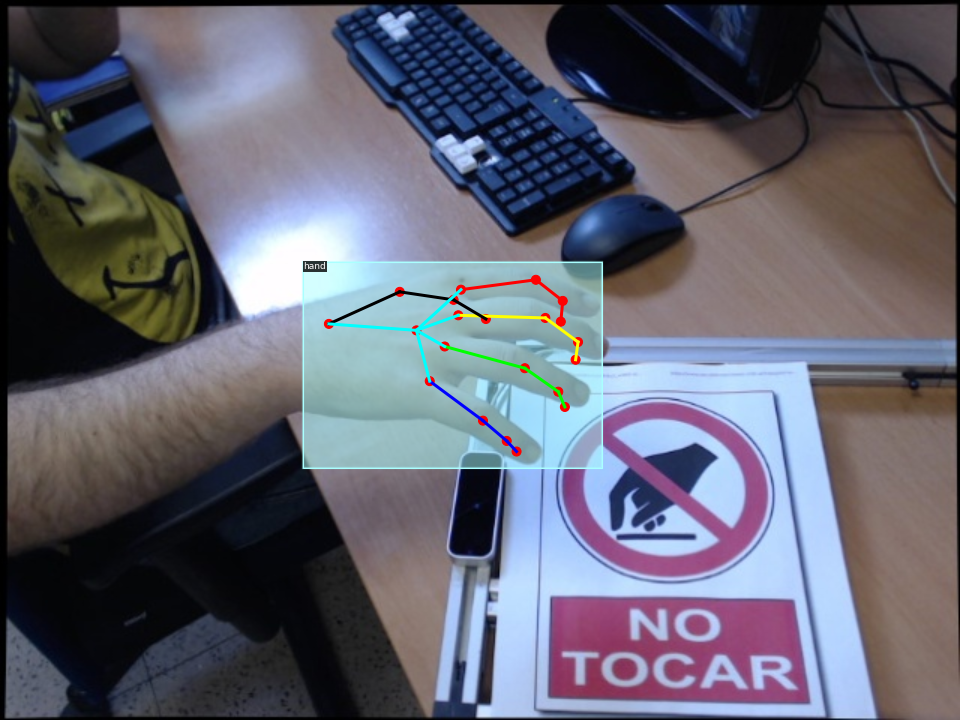

/content/drive/My Drive/LSMV_imgs/data_1/134_webcam_2.jpg


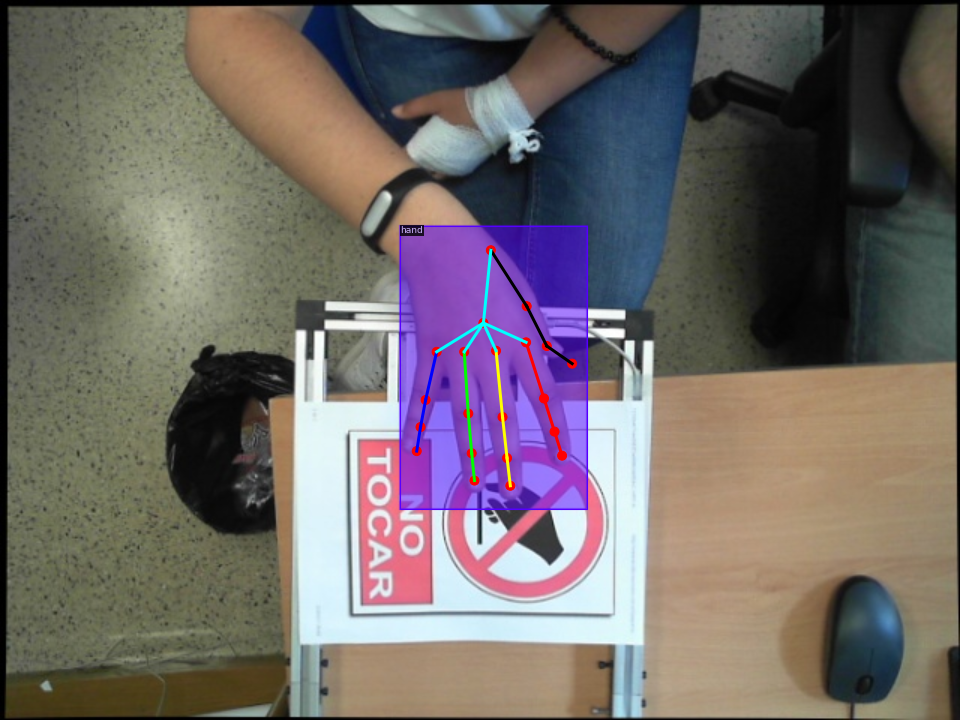

/content/drive/My Drive/LSMV_imgs/data_20/282_webcam_3.jpg


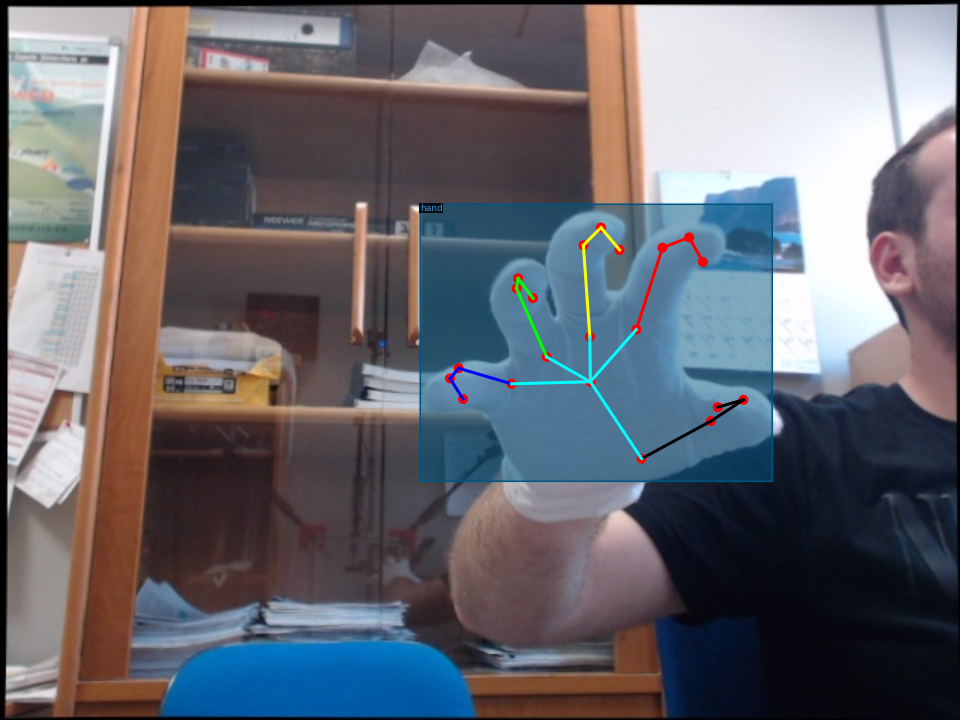

/content/drive/My Drive/LSMV_imgs/data_12/1481_webcam_4.jpg


In [ ]:
from detectron2.utils.visualizer import Visualizer

dataset_dicts = DatasetCatalog.get("LSMV_test")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=val_metadata, scale=1.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])
    print(d["file_name"])

In [ ]:
val_metadata.keypoint_flip_map=[]
val_metadata.keypoint_names=["0","1","2","3","4","5","6","7","8","9","10","11","12","13","14","15","16","17","18","19","20"]
val_metadata.keypoint_connection_rules=[("0","2",(255,0,0)),("2",'3',(255,0,0)),('1','0',(255,0,0)),('4','6',(255,255,0)),('6','7',(255,255,0)),('4','5',(255,255,0)),('12','14',(0,255,0)),('14','15',(0,255,0)),('12','13',(0,255,0)),('8','10',(0,0,255)),('10','11',(0,0,255)),('8','9',(0,0,255)),('16','18',(0,0,0)),('18','19',(0,0,0)),('16','17',(0,0,0)),('20','1',(0,255,255)),('20','5',(0,255,255)),('20','13',(0,255,255)),('20','9',(0,255,255)),('20','17',(0,255,255))]

In [ ]:
train_metadata.keypoint_flip_map=[]
train_metadata.keypoint_names=["0","1","2","3","4","5","6","7","8","9","10","11","12","13","14","15","16","17","18","19","20"]
train_metadata.keypoint_connection_rules=[("0","2",(255,0,0)),("2",'3',(255,0,0)),('1','0',(255,0,0)),('4','6',(255,255,0)),('6','7',(255,255,0)),('4','5',(255,255,0)),('12','14',(0,255,0)),('14','15',(0,255,0)),('12','13',(0,255,0)),('8','10',(0,0,255)),('10','11',(0,0,255)),('8','9',(0,0,255)),('16','18',(0,0,0)),('18','19',(0,0,0)),('16','17',(0,0,0)),('20','1',(0,255,255)),('20','5',(0,255,255)),('20','13',(0,255,255)),('20','9',(0,255,255)),('20','17',(0,255,255))]

## Training

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file("/content/drive/My Drive/KP_RN_Configs/KP_RN_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("LSMV_train",)
cfg.DATASETS.VAL = ()
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.MODEL.DEVICE = "cuda"
cfg.MODEL.WEIGHTS = '/content/drive/My Drive/LSMV_bbox_4k_correct/model_final.pth'
cfg.SOLVER.BASE_LR = 0.0001 
cfg.VIS_PERIOD = 0

cfg.MODEL.ROI_KEYPOINT_HEAD.LOSS_WEIGHT = 1.0
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 2
cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 1.0
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[x, x * 2**(1.0/3), x * 2**(2.0/3) ] for x in [64, 128, 256, 512 ]] 
cfg.SOLVER.MAX_ITER = 5000
cfg.SOLVER.WARMUP_ITERS = 200
cfg.OUTPUT_DIR = "./output"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

In [ ]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir='/content/drive/My Drive/KPRetinaNet_L1_loss_LSMV_8k'

<IPython.core.display.Javascript object>

## Visualising predictions on test set using the trained model


In [ ]:
cfg.MODEL.WEIGHTS = '/content/drive/My Drive/KPRetinaNet_L1_loss_LSMV_8k/model_final.pth'
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.4
cfg.DATASETS.TEST = ("LSMV_test", )
predictor = DefaultPredictor(cfg)

[07/21 19:16:57 d2.data.datasets.coco]: Loaded 16552 images in COCO format from /content/drive/My Drive/LSMV_test_correct_21.json


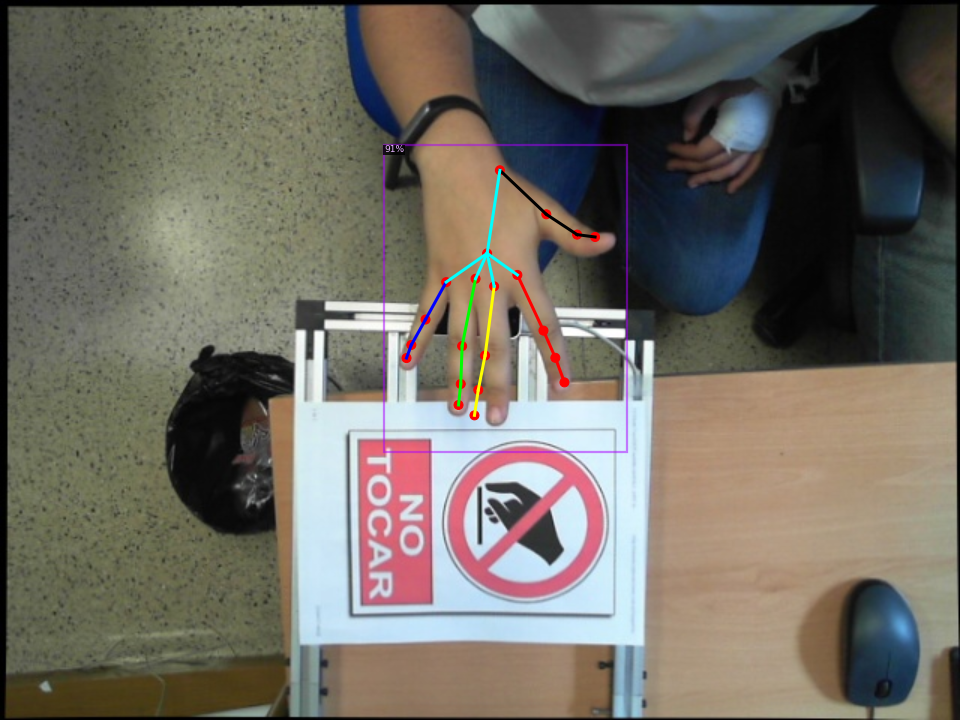

/content/drive/My Drive/LSMV_imgs/data_21/1654_webcam_3.jpg


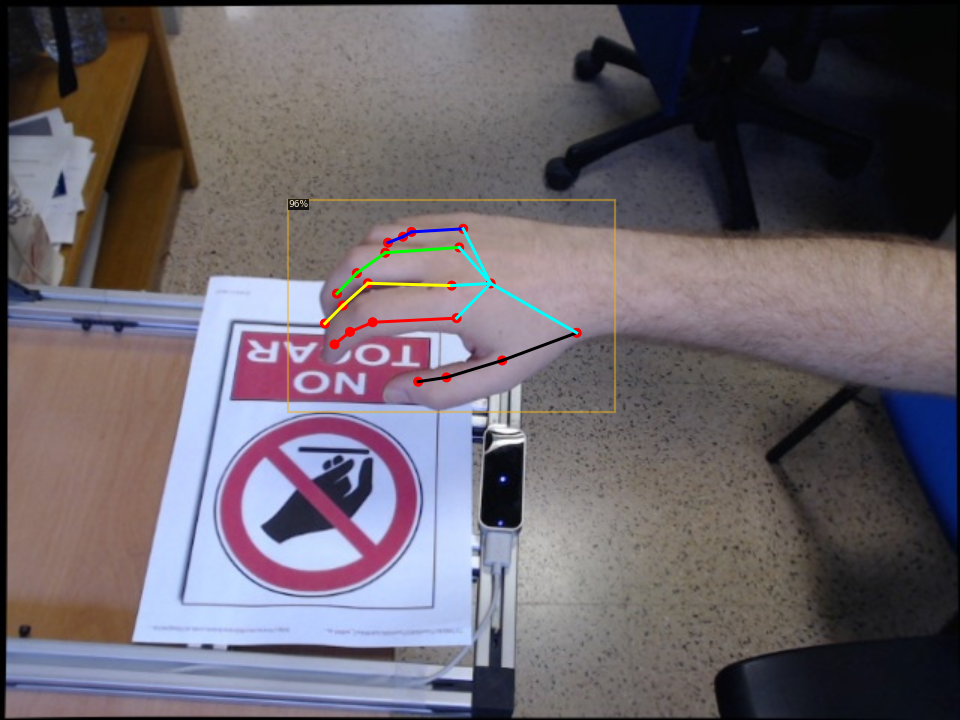

/content/drive/My Drive/LSMV_imgs/data_4/761_webcam_1.jpg


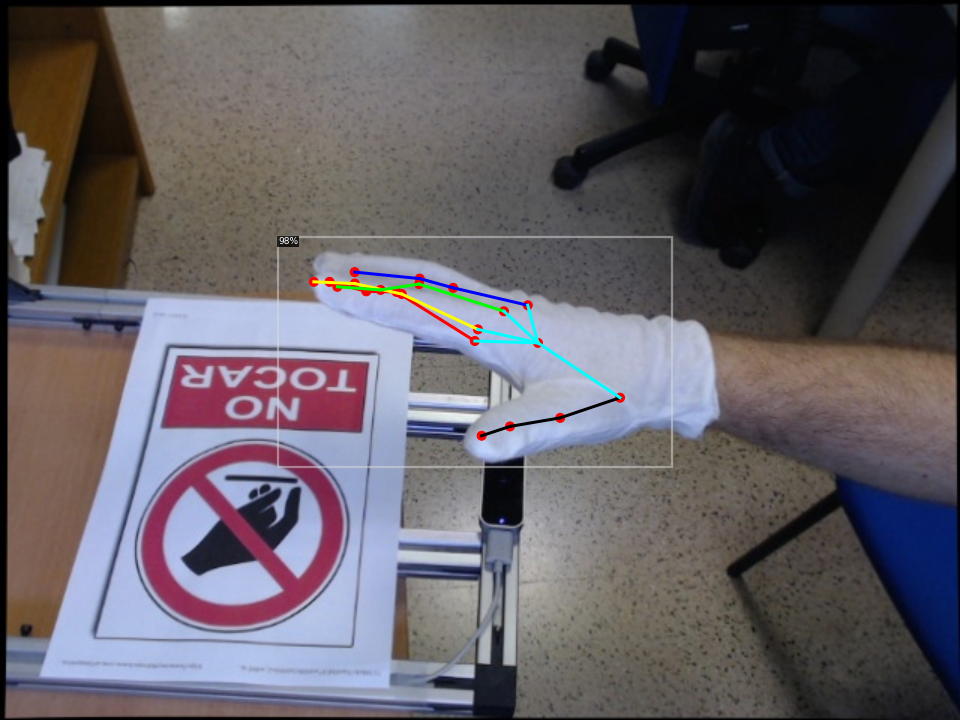

/content/drive/My Drive/LSMV_imgs/data_12/1343_webcam_1.jpg


In [ ]:
from detectron2.utils.visualizer import Visualizer

dataset_dicts = DatasetCatalog.get("LSMV_test")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    v = Visualizer(img[:, :, ::-1],
                   metadata=val_metadata, 
                   scale=1.5, 
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])
    print(d["file_name"])